# Characterizing Natural Soundscapes with Audio Features and Principal Component Analysis

Jeff Trevino, PhD
May 12, 2020

*librosa code and feature explanations from the [CCRMA Music Information Retrieval summer intensive github repo](https://github.com/bmcfee/stanford-mir)*

# Outcomes

* trace an entire analysis pipeline (acquisition, wrangling, feature extraction, analysis)

# Outcomes

* consider problems, features, and tools for audio data

# Project Context

* National Geographic Nature Nurtures

# Project Context

* interpretable feature contributions, not prediction

In [260]:
%matplotlib inline
import IPython.display as ipd
import  numpy as np
import matplotlib.pyplot as plt
import librosa, librosa.display
import seaborn as sns
import sklearn
import pandas as pd
plt.rcParams['figure.figsize'] = (14, 5)

In [261]:
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)

In [262]:
sns.set_style('whitegrid')

# load audio

load the audio from the "forest" video:

In [285]:
sns.set_style('whitegrid')

In [286]:
x, sr = librosa.load('../../audioFiles/forest.wav')

In [287]:
ipd.Audio(x, rate=sr)

# Spectrograms

In [288]:
S = librosa.stft(x)
print(S.shape)

(1025, 7383)


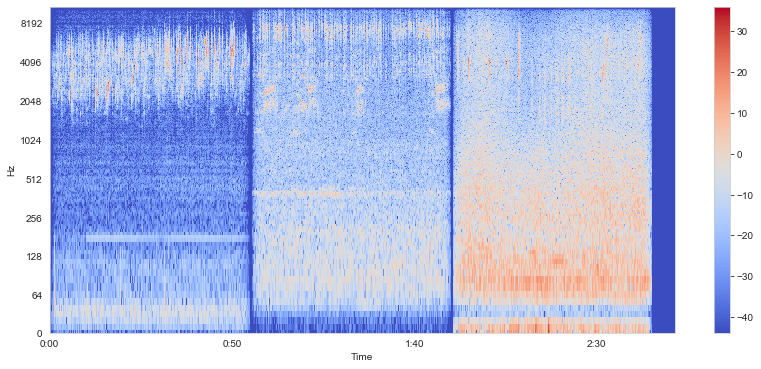

In [289]:
Smag = librosa.amplitude_to_db(np.abs(S))
librosa.display.specshow(Smag, sr=sr, x_axis='time', y_axis='log')
plt.colorbar()
plt.show()

# define helper functions to normalize

In [290]:
# normalize data between 0 and 1 for visualization
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)

# extract root mean square energy

In [291]:
hop_length = 512
frame_length = 2048

In [292]:
energy = np.array([
    sum(abs(x[i:i+frame_length]**2))
    for i in range(0, len(x), hop_length)
])

In [293]:
energy.shape

(7383,)

In [294]:
rms = librosa.feature.rms(x, frame_length=frame_length, hop_length=hop_length)[0]

In [295]:
rms.shape

(7383,)

In [296]:
frames = range(len(energy))
t = librosa.frames_to_time(frames, sr=sr, hop_length=hop_length)

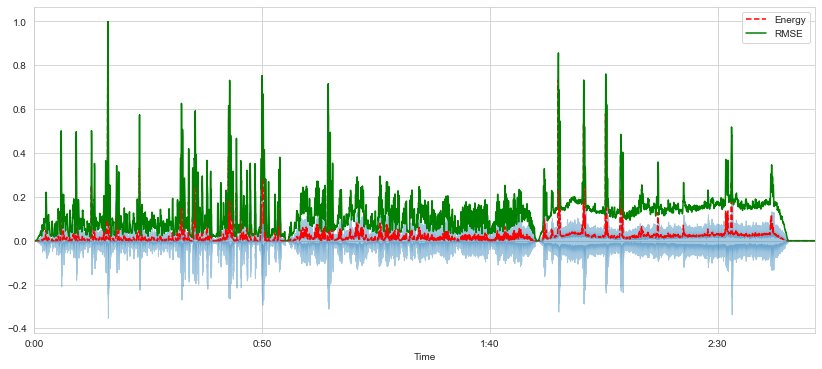

In [297]:
librosa.display.waveplot(x, sr=sr, alpha=0.4)
plt.plot(t, energy/energy.max(), 'r--')             # normalized for visualization
plt.plot(t[:len(rms)], rms/rms.max(), color='g') # normalized for visualization
plt.legend(('Energy', 'RMSE'))
plt.show()

In [298]:
rms = sklearn.preprocessing.scale(rms)

/Users/trqk-data/.local/share/virtualenvs/nature-nurtures--FcyQ97q/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:190: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


In [299]:
rms.mean()

-1.6533972e-08

In [300]:
rms.var()

0.9999999

# extract zero line crossing rate

Zero line crossing rate counts the number of times the waveform crosses the zero line. A higher rate correlates with a more percussive sound (drums), while a lower rate correlates with periodic (pitched) sounds (notes).

### For Example: Consider a Drumkit

In [252]:
y, sr = librosa.load('../../audioFiles/simple_loop.wav')

In [253]:
ipd.Audio(y, rate=sr)

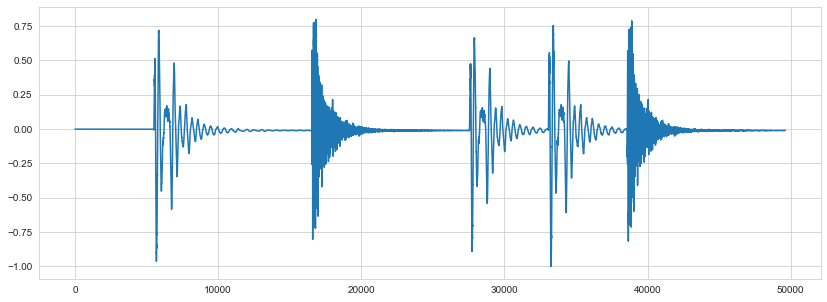

In [254]:
plt.figure(figsize=(14, 5))
plt.plot(y)

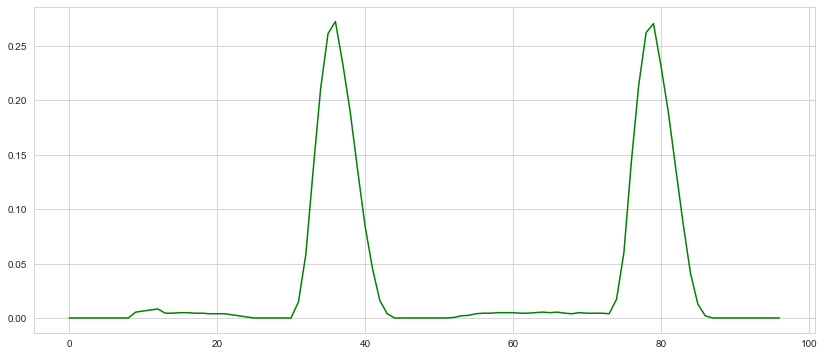

In [255]:
zcrs = librosa.feature.zero_crossing_rate(y + 0.0001)
plt.plot(zcrs[0], 'g')
plt.show()

### ...and Back to the Forest

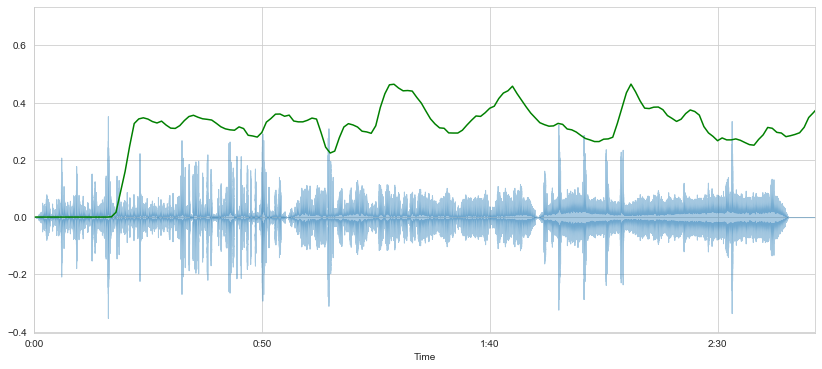

In [256]:
librosa.display.waveplot(x, sr=sr, alpha=0.4)
zcrs = librosa.feature.zero_crossing_rate(x + 0.0001)
plt.plot(zcrs[0], 'g')
plt.show()

# extract spectral features

### extract spectral centroid

The **spectral centroid** ([Wikipedia](https://en.wikipedia.org/wiki/Spectral_centroid)) indicates at which frequency the energy of a spectrum is centered upon. This is like a weighted mean:

$$ f_c = \frac{\sum_k S(k) f(k)}{\sum_k S(k)} $$

where $S(k)$ is the spectral magnitude at frequency bin $k$, $f(k)$ is the frequency at bin $k$.

[`librosa.feature.spectral_centroid`](https://librosa.github.io/librosa/generated/librosa.feature.spectral_centroid.html#librosa.feature.spectral_centroid) computes the spectral centroid for each frame in a signal:

In [257]:
spectral_centroids = librosa.feature.spectral_centroid(x+0.01, sr=sr)[0] # add constant to correct value at silence

In [258]:
# calculate time variable for plotting
frames = range(len(spectral_centroids))
t = librosa.frames_to_time(frames)

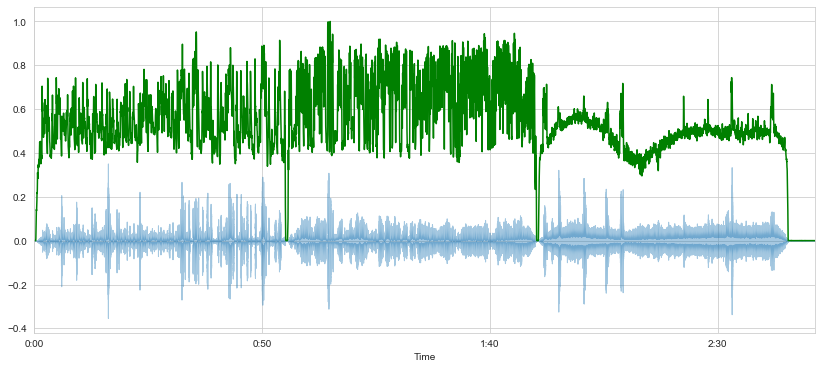

In [259]:
librosa.display.waveplot(x, sr=sr, alpha=0.4)
plt.plot(t, normalize(spectral_centroids), color='g') # normalize for visualization purposes
plt.show()

In [52]:
spectral_centroids = sklearn.preprocessing.scale(spectral_centroids)

In [53]:
spectral_centroids.mean()

6.159384408593582e-17

In [54]:
spectral_centroids.var()

1.0000000000000002

### extract spectral bandwidth

[`librosa.feature.spectral_bandwidth`](https://librosa.github.io/librosa/generated/librosa.feature.spectral_bandwidth.html#librosa.feature.spectral_bandwidth) computes the order-$p$ spectral bandwidth:

$$ \left( \sum_k S(k) \left(f(k) - f_c \right)^p \right)^{\frac{1}{p}} $$

where $S(k)$ is the spectral magnitude at frequency bin $k$, $f(k)$ is the frequency at bin $k$, and $f_c$ is the spectral centroid. When $p = 2$, this is like a weighted standard deviation.

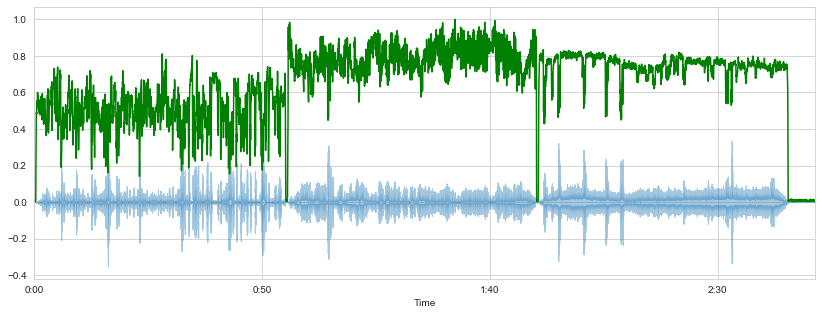

In [55]:
spectral_bandwidth_2 = librosa.feature.spectral_bandwidth(x+0.01, sr=sr)[0]
librosa.display.waveplot(x, sr=sr, alpha=0.4)
plt.plot(t, normalize(spectral_bandwidth_2), color='g')
plt.show()

In [56]:
spectral_bandwidth_2 = sklearn.preprocessing.scale(spectral_bandwidth_2)

In [57]:
spectral_bandwidth_2.mean()

-1.5398461021483954e-16

In [58]:
spectral_bandwidth_2.var()

1.0000000000000002

### extract spectral rolloff

**Spectral rolloff** is the frequency below which a specified percentage of the total spectral energy, e.g. 85%, lies.

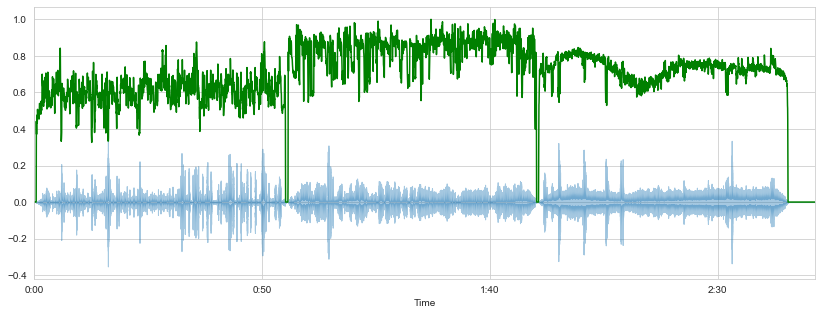

In [59]:
spectral_rolloff = librosa.feature.spectral_rolloff(x+0.01, sr=sr)[0]
librosa.display.waveplot(x, sr=sr, alpha=0.4)
plt.plot(t, normalize(spectral_rolloff), color='g')
plt.show()

In [60]:
spectral_rolloff = sklearn.preprocessing.scale(spectral_rolloff)

In [61]:
spectral_rolloff.mean()

1.3858614919335558e-16

In [62]:
spectral_rolloff.var()

0.9999999999999997

### extract spectral novelty

We will compute a **spectral novelty function** (Meinard Muller's [Fundamentals of Music Processing](https://www.audiolabs-erlangen.de/resources/MIR/FMP/C0/C0.html), p. 309):

1.  Compute the log-amplitude spectrogram.
2.  Within each frequency bin, $k$, compute the energy novelty function (first-order difference).
3.  Sum across all frequency bins, $k$.

In [63]:
spectral_novelty = librosa.onset.onset_strength(x, sr=sr)

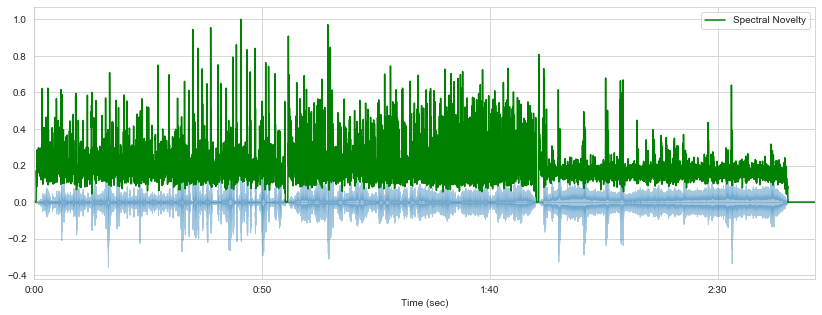

In [64]:
librosa.display.waveplot(x, sr=sr, alpha=0.4)
plt.plot(t, normalize(spectral_novelty), 'g')
plt.xlim(0, t.max())
plt.xlabel('Time (sec)')
plt.legend(('Spectral Novelty',))
plt.show()

In [65]:
spectral_novelty = sklearn.preprocessing.scale(spectral_novelty)

/Users/trqk-data/.local/share/virtualenvs/nature-nurtures--FcyQ97q/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:190: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


In [66]:
spectral_novelty.mean()

0.0

In [67]:
spectral_novelty.var()

1.0000001

### Extract Mel Frequency Cepstral Coefficients (MFCCs)

MFCC features track change in frequency bands defined by human perception via [the mel scale](https://en.wikipedia.org/wiki/Mel_scale). For an excellent step-by-step narrative of how to derive these features, check out this post at [practicalcryptography.com](http://practicalcryptography.com/miscellaneous/machine-learning/guide-mel-frequency-cepstral-coefficients-mfccs/).

In [68]:
mfccs = librosa.feature.mfcc(x, sr=sr)
print(mfccs.shape)

(20, 7383)


Let's scale the MFCCs such that each coefficient dimension has zero mean and unit variance:

In [69]:
mfccs = sklearn.preprocessing.scale(mfccs, axis=1)
print(mfccs.mean(axis=1))
print(mfccs.var(axis=1))

[ 0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -8.2669862e-09 -8.2669862e-09  8.2669862e-09  3.3067945e-08
  0.0000000e+00  0.0000000e+00  0.0000000e+00 -8.2669862e-09
 -1.6533972e-08  0.0000000e+00  0.0000000e+00 -8.2669862e-09
  0.0000000e+00  0.0000000e+00  0.0000000e+00  8.2669862e-09]
[1.         1.0000001  1.         1.         0.99999994 1.0000001
 0.99999994 1.         1.         0.9999999  1.0000001  1.0000001
 1.         1.         1.         0.99999994 1.         1.0000001
 0.9999999  1.        ]


/Users/trqk-data/.local/share/virtualenvs/nature-nurtures--FcyQ97q/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:173: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/trqk-data/.local/share/virtualenvs/nature-nurtures--FcyQ97q/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:190: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


Display all the scaled MFCCs:

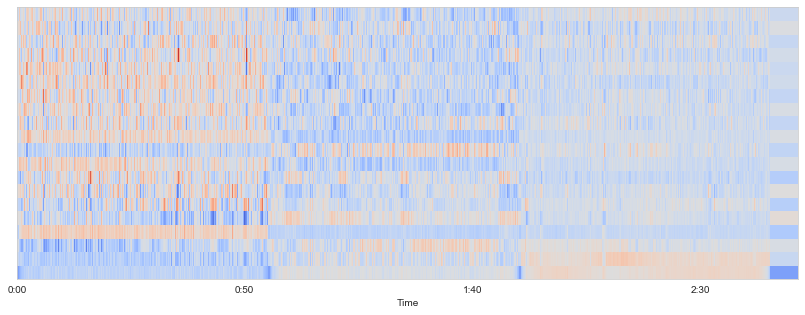

In [70]:
librosa.display.specshow(mfccs, sr=sr, x_axis='time')
plt.show()

MFCCs distinctively characterize our three data samples:

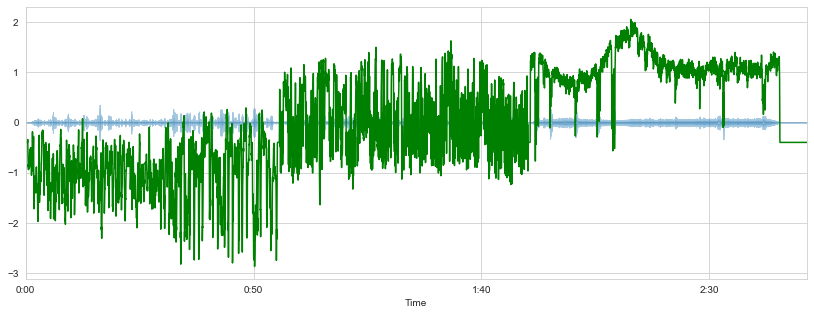

In [71]:
librosa.display.waveplot(x, sr=sr, alpha=0.4)
plt.plot(t, mfccs[1], color='g')
plt.show()

# Create Feature Vector

Append spectral features to MFCCs as new rows of the array:

In [72]:
def add_dimension_to_array(the_array):
    cols = the_array.shape[0]
    return numpy.reshape(the_array, (-1, 7383))

In [73]:
mfccs.shape

(20, 7383)

In [74]:
spectral_features = [
rms,
spectral_centroids,
spectral_bandwidth_2,
spectral_rolloff,
spectral_novelty,
]

In [75]:
X = mfccs
for feature in spectral_features:
    X = numpy.append(X, add_dimension_to_array(feature), axis=0)

In [76]:
X.shape

(25, 7383)

features 0-19 are MFCCs, after which:
* index 20: RMS
* index 21: spectral centroid
* index 22: spectral bandwidth
* index 23: spectral rolloff
* index 24: spectral novelty

## Write Out Numpy Array as a Labelled DataFrame

In [88]:
X_t = pd.DataFrame(X).transpose()
X_t.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24
0,-3.015755,-0.397076,0.229369,-1.304138,0.733048,-1.007205,0.498591,-1.119346,0.166063,-0.664103,0.281189,-0.568935,0.208142,-0.539655,-0.104379,-0.339236,-0.018342,-0.460733,0.361926,-0.301799,-1.328486,-3.033514,-3.221025,-3.636567,-1.778926
1,-3.015755,-0.397076,0.229369,-1.304138,0.733048,-1.007205,0.498591,-1.119346,0.166063,-0.664103,0.281189,-0.568935,0.208142,-0.539655,-0.104379,-0.339236,-0.018342,-0.460733,0.361926,-0.301799,-1.328485,-3.030483,-3.175067,-3.636567,-1.778926
2,-3.015755,-0.397076,0.229369,-1.304138,0.733048,-1.007205,0.498591,-1.119346,0.166063,-0.664103,0.281189,-0.568935,0.208142,-0.539655,-0.104379,-0.339236,-0.018342,-0.460733,0.361926,-0.301799,-1.328481,-3.029094,-3.154459,-3.636567,-1.778926
3,-3.015755,-0.397076,0.229369,-1.304138,0.733048,-1.007205,0.498591,-1.119346,0.166063,-0.664103,0.281189,-0.568935,0.208142,-0.539655,-0.104379,-0.339236,-0.018342,-0.460733,0.361926,-0.301799,-1.328481,-3.030367,-3.172275,-3.636567,-1.778926
4,-3.015755,-0.397076,0.229369,-1.304138,0.733048,-1.007205,0.498591,-1.119346,0.166063,-0.664103,0.281189,-0.568935,0.208142,-0.539655,-0.104379,-0.339236,-0.018342,-0.460733,0.361926,-0.301799,-1.328483,-3.029944,-3.162729,-3.636567,-1.778926


In [199]:
# name our columns legibly
labels = ['mfcc_' + str(x) for x in range(20)]
labels.extend(['rms', 'centroid', 'bandwidth', 'rolloff', 'novelty'])
X_t.columns = labels

In [200]:
X_t.head()

,mfcc_0,mfcc_1,mfcc_2,mfcc_3,mfcc_4,mfcc_5,mfcc_6,mfcc_7,mfcc_8,mfcc_9,mfcc_10,mfcc_11,mfcc_12,mfcc_13,mfcc_14,mfcc_15,mfcc_16,mfcc_17,mfcc_18,mfcc_19,rms,centroid,bandwidth,rolloff,novelty
0,-3.015755,-0.397076,0.229369,-1.304138,0.733048,-1.007205,0.498591,-1.119346,0.166063,-0.664103,0.281189,-0.568935,0.208142,-0.539655,-0.104379,-0.339236,-0.018342,-0.460733,0.361926,-0.301799,-1.328486,-3.033514,-3.221025,-3.636567,-1.778926
1,-3.015755,-0.397076,0.229369,-1.304138,0.733048,-1.007205,0.498591,-1.119346,0.166063,-0.664103,0.281189,-0.568935,0.208142,-0.539655,-0.104379,-0.339236,-0.018342,-0.460733,0.361926,-0.301799,-1.328485,-3.030483,-3.175067,-3.636567,-1.778926
2,-3.015755,-0.397076,0.229369,-1.304138,0.733048,-1.007205,0.498591,-1.119346,0.166063,-0.664103,0.281189,-0.568935,0.208142,-0.539655,-0.104379,-0.339236,-0.018342,-0.460733,0.361926,-0.301799,-1.328481,-3.029094,-3.154459,-3.636567,-1.778926
3,-3.015755,-0.397076,0.229369,-1.304138,0.733048,-1.007205,0.498591,-1.119346,0.166063,-0.664103,0.281189,-0.568935,0.208142,-0.539655,-0.104379,-0.339236,-0.018342,-0.460733,0.361926,-0.301799,-1.328481,-3.030367,-3.172275,-3.636567,-1.778926
4,-3.015755,-0.397076,0.229369,-1.304138,0.733048,-1.007205,0.498591,-1.119346,0.166063,-0.664103,0.281189,-0.568935,0.208142,-0.539655,-0.104379,-0.339236,-0.018342,-0.460733,0.361926,-0.301799,-1.328483,-3.029944,-3.162729,-3.636567,-1.778926


# Apply Principal Component Analysis to See Which Features Predict the Signal Most

Principal Component Analysis reduces the number of dimensions by projecting our dataset into a space with fewer dimensions. (For an excellent step-by-step narrative of the way we use eigenvectors and eigenvalues to project, see Lindsay Smith's [A Tutorial on Principal Component Analysis](http://www.cs.otago.ac.nz/research/publications/OUCS-2002-12.pdf) (2002)). In our case, this looks like: 
(1) reducing our 25 dimensions to 2 linearly independent components
(2) 

## How Many Components Should We Choose?

*PCA visualization code from [Prasad Ostwal's blog (entry from January 20, 2019)](https://ostwalprasad.github.io/machine-learning/PCA-using-python.html)*

### Well, How Much Variance Does Each Component Explain?

In [305]:
model = sklearn.decomposition.PCA(n_components=10, whiten=True)

In [306]:
model.fit(X_t)

PCA(copy=True, iterated_power='auto', n_components=10, random_state=None,
    svd_solver='auto', tol=0.0, whiten=True)

In [307]:
Y = model.transform(X_t)

In [308]:
print(Y.shape)

(7383, 10)


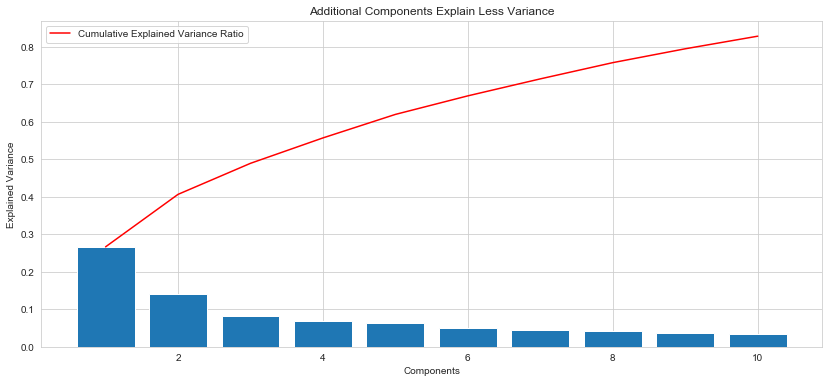

In [309]:
plt.bar(range(1, len(model.explained_variance_ratio_ ) + 1 ), model.explained_variance_ratio_ )
plt.ylabel('Explained Variance')
plt.xlabel('Components')
plt.plot(range(1, len(model.explained_variance_ratio_ ) + 1),
         np.cumsum(model.explained_variance_ratio_),
         c='red',
         label="Cumulative Explained Variance Ratio")
plt.title('Additional Components Explain Less Variance')
plt.legend(loc='upper left')
plt.show()

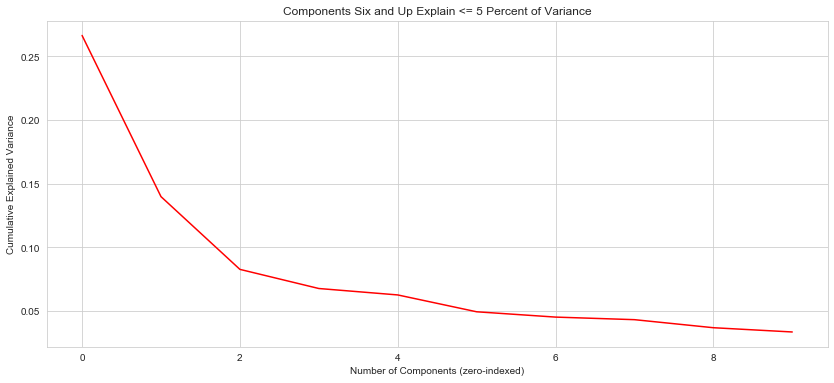

In [310]:
plt.plot(model.explained_variance_ratio_, 'r', label='blah')
plt.xlabel('Number of Components (zero-indexed)')
plt.ylabel('Cumulative Explained Variance')
plt.title('Components Six and Up Explain <= 5 Percent of Variance')
plt.show()

In [311]:
model.components_.shape

(10, 25)

## Which Features Contribute Most to Our First Two Components?

In [338]:
model = sklearn.decomposition.PCA(n_components=2, whiten=True)

In [339]:
model.fit(X_t)

PCA(copy=True, iterated_power='auto', n_components=2, random_state=None,
    svd_solver='auto', tol=0.0, whiten=True)

In [340]:
Y = model.transform(X_t)


In [341]:
# name our columns legibly
labels = ['mfcc_' + str(x) for x in range(20)]
labels.extend(['rms', 'centroid', 'bandwidth', 'rolloff', 'novelty'])
X_t.columns = labels

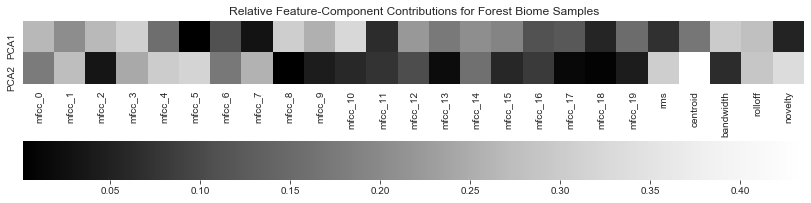

In [353]:
f, ax = plt.subplots(figsize=(14, 7))

ax = sns.heatmap(abs(model.components_),
                 cmap='Greys_r',
                 ax=ax,
                 yticklabels=["PCA" + str(x) for x in range(1, model.n_components_ + 1)],
                 xticklabels=list(X_t.columns),
                 cbar_kws={"orientation": "horizontal"})
ax.set_aspect("equal")
plt.title('Relative Feature-Component Contributions for Forest Biome Samples')
plt.show()

In [359]:
normed_1 = abs(model.components_[0]) / model.explained_variance_[0]
normed_2 = abs(model.components_[1]) / model.explained_variance_[1]
normed_by_explained_variance = np.array([normed_1, normed_2])

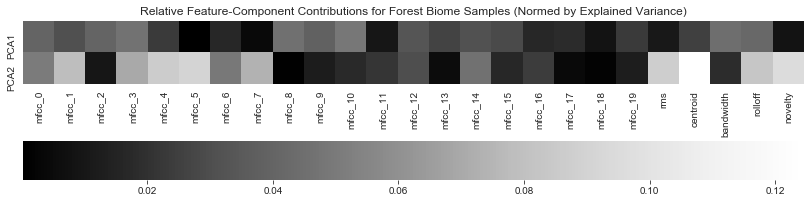

In [360]:
f, ax = plt.subplots(figsize=(14, 7))

ax = sns.heatmap(normed_by_explained_variance,
                 cmap='Greys_r',
                 ax=ax,
                 yticklabels=["PCA" + str(x) for x in range(1, model.n_components_ + 1)],
                 xticklabels=list(X_t.columns),
                 cbar_kws={"orientation": "horizontal"})
ax.set_aspect("equal")
plt.title('Relative Feature-Component Contributions for Forest Biome Samples (Normed by Explained Variance)')
plt.show()

# Q & A